In [1]:
%cd ..

c:\Users\simon\Desktop\repo\pollinator-ml-backend


In [3]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
import json
import yaml

from src.pipeline.clients import get_db_client, get_minio_client
from src.pipeline.extract import download_files

In [32]:
# Preprocess results from model_predict
with open('flower_predictions.json', 'r') as json_file:
    flower_predictions = pd.DataFrame.from_records(json.load(json_file))
flower_predictions.head(2)

,object_name,flower_box_id,flower_box,flower_class,flower_score,flower_name,width,height
0,0344-6782/2021-06-21/08/0344-6782_2021-06-21T0...,0,"[1145.144775390625, 939.006591796875, 1197.426...",0,0.915887,daisy,82,93
1,0344-6782/2021-06-21/08/0344-6782_2021-06-21T0...,1,"[1250.1650390625, 1061.8956298828125, 1317.565...",0,0.913939,daisy,97,101


In [33]:
with open('model_config.json', 'r') as json_file:
    model_config = json.load(json_file)
model_config

{'config_id': 'CONFIG017',
 'flower': {'weights_path': '.\\src\\pipeline\\Pollinatordetection\\models\\flowers_ds_v5_640_yolov5n_box_hyps_v0.pt',
  'class_names': ['daisy', 'wildemoere', 'flockenblume'],
  'confidence_threshold': 0.33,
  'iou_threshold': 0.45,
  'max_detections': 30,
  'margin': 15,
  'multi_label': False,
  'multi_label_iou_threshold': 0.9,
  'augment': False,
  'image_size': 640},
 'pollinator': {'weights_path': '.\\src\\pipeline\\Pollinatordetection\\models\\pollinators_ds_v6_480_yolov5s_hyps_v0.pt',
  'class_names': ['honigbiene',
   'wildbiene',
   'hummel',
   'schwebfliege',
   'fliege'],
  'confidence_threshold': 0.65,
  'iou_threshold': 0.45,
  'max_detections': 10,
  'margin': 50,
  'multi_label': False,
  'multi_label_iou_threshold': 0.45,
  'augment': False,
  'image_size': 480}}

In [34]:
result_ids = pd.read_csv('checkpoint_df.csv')
result_ids.head(2)

,file_id,object_name,result_id,config_id
0,2,0344-6782/2021-06-21/08/0344-6782_2021-06-21T0...,5656,CONFIG017
1,3,0344-6782/2021-06-21/08/0344-6782_2021-06-21T0...,5657,CONFIG017


In [35]:
def process_flower_predictions(flower_predictions: dict, result_ids: pd.DataFrame, model_config: dict) -> pd.DataFrame:
    box_margin = model_config['flower']['margin']
    # Preprocess results from model_predict
    flower_predictions = pd.DataFrame.from_records(flower_predictions)
    
    # Join with DB data
    flower_predictions = pd.merge(
        left=result_ids, 
        right=flower_predictions, 
        left_on='object_name', 
        right_on='object_name', 
        how='right'
    )
    # extract bbox data
    flower_predictions['x0'] = flower_predictions['flower_box'].apply(lambda x: x[0]).astype(int)
    flower_predictions['y0'] = flower_predictions['flower_box'].apply(lambda x: x[1]).astype(int)
    flower_predictions['x1'] = flower_predictions['flower_box'].apply(lambda x: x[2]).astype(int)
    flower_predictions['y1'] = flower_predictions['flower_box'].apply(lambda x: x[3]).astype(int)
    
    flower_predictions = flower_predictions.drop('flower_box', axis=1)

    return flower_predictions

result_ids = {obj_name:idx for idx, obj_name in enumerate(np.unique(flower_predictions['object_name'].to_list()))}
results = flower_predictions[['object_name']].copy()
results['result_id'] = flower_predictions['object_name'].replace(result_ids)
results

In [36]:
tmp = process_flower_predictions(
    flower_predictions=flower_predictions, 
    model_config=model_config, 
    result_ids=result_ids
)
tmp.head(2)

,file_id,object_name,result_id,config_id,flower_box_id,flower_class,flower_score,flower_name,width,height,x0,y0,x1,y1
0,2,0344-6782/2021-06-21/08/0344-6782_2021-06-21T0...,5656,CONFIG017,0,0,0.915887,daisy,82,93,1145,939,1197,1002
1,2,0344-6782/2021-06-21/08/0344-6782_2021-06-21T0...,5656,CONFIG017,1,0,0.913939,daisy,97,101,1250,1061,1317,1132


In [37]:
def draw_bbox(img_path, x0, x1, y0, y1):
    img = cv2.imread(img_path)[:,:,::-1]
    # Create figure and axes
    fig, ax = plt.subplots(figsize=(10, 10))

    # Display the image
    ax.imshow(img)

    # Coordinates of rectangle vertices
    # in clockwise order
    xs = [x0, x1, x1, x0, x0]
    ys = [y0, y0, y1, y1, y0]
    ax.plot(xs, ys, color="red")

    plt.show()

    
def draw_anchors(img_path, x0, x1, y0, y1):
    img = cv2.imread(img_path)[:,:,::-1]
    # Create figure and axes
    fig, ax = plt.subplots(figsize=(10, 10))

    # Display the image
    ax.imshow(img)

    # Coordinates of rectangle vertices
    # in clockwise order
    xs = [x0, x1]
    ys = [y0, y1]
    ax.scatter(xs, ys, color="red", s=1)

    plt.show()

Flower


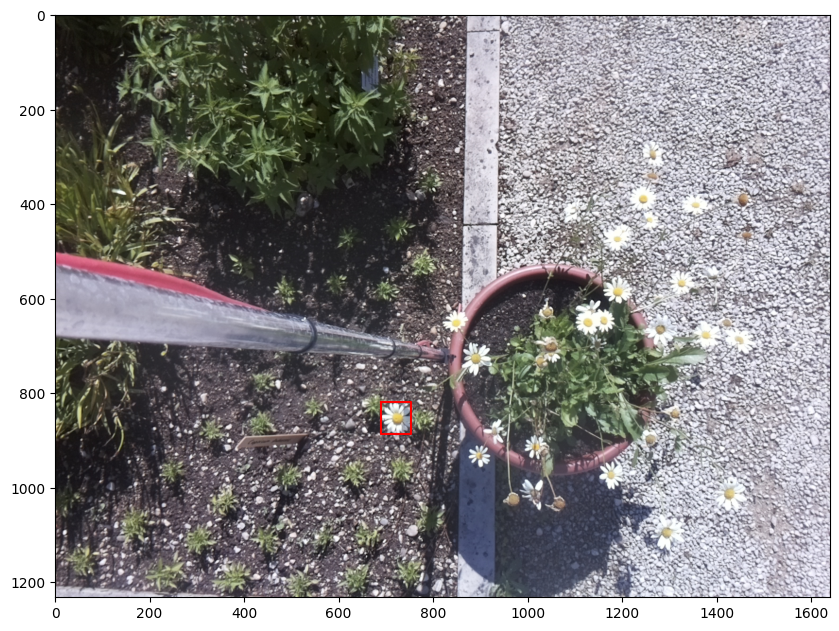

In [40]:
print('Flower')
sample = tmp.sample(1)
draw_bbox(
    sample['object_name'].iloc[0], 
    sample['x0'].iloc[0],
    sample['x1'].iloc[0], 
    sample['y0'].iloc[0], 
    sample['y1'].iloc[0]
)

In [23]:
# Preprocess results from model_predict
with open('pollinator_predictions.json', 'r') as json_file:
    pollinator_predictions = pd.DataFrame.from_records(json.load(json_file))
pollinator_predictions.head(2)

,object_name,flower_box_id,pollinator_boxes,pollinator_classes,pollinator_scores,pollinator_names
0,0344-6782/2021-06-21/08/0344-6782_2021-06-21T0...,9,"[35.54256057739258, 48.67624282836914, 46.5154...",1,0.702599,wildbiene
1,0344-6782/2021-06-21/08/0344-6782_2021-06-21T0...,5,"[48.67750930786133, 35.599178314208984, 61.916...",4,0.661216,fliege


In [24]:
def process_pollinator_predictions(pollinator_predictions: dict, flower_predictions: pd.DataFrame, model_config: dict):
    
    box_margin = model_config['flower']['margin']
    flower_predictions['x0'] = flower_predictions['x0'] - box_margin
    flower_predictions['y0'] = flower_predictions['y0'] - box_margin
    flower_predictions['x1'] = flower_predictions['x1'] + box_margin
    flower_predictions['y1'] = flower_predictions['y1'] + box_margin
    

    if isinstance(pollinator_predictions, dict):
        pollinator_predictions = pd.DataFrame.from_records(json.load(json_file))
    
    # Join with DB data
    # Merge with flowers to get size of BB
    pollinator_predictions = pd.merge(
        left=pollinator_predictions, 
        right=flower_predictions[['object_name', 'flower_box_id', 'result_id', 'x0', 'y0', 'x1', 'y1']], 
        left_on=['object_name', 'flower_box_id'], right_on=['object_name', 'flower_box_id'], 
        how='inner'
    )
    # rename columns
    pollinator_predictions = pollinator_predictions.rename(
        columns={
            'x0': 'f_x0', 'x1': 'f_x1',
            'y0': 'f_y0', 'y1': 'f_y1'
        }
    )
    # Calculate BBoxes given previous flower perdiction
    pollinator_predictions['p_x0'] = pollinator_predictions['pollinator_boxes'].apply(lambda x: x[0]).astype(int)
    pollinator_predictions['p_y0'] = pollinator_predictions['pollinator_boxes'].apply(lambda x: x[1]).astype(int)
    pollinator_predictions['p_x1'] = pollinator_predictions['pollinator_boxes'].apply(lambda x: x[2]).astype(int)
    pollinator_predictions['p_y1'] = pollinator_predictions['pollinator_boxes'].apply(lambda x: x[3]).astype(int)

    # new_xmin = flower_xmin + polli_xmin / new_ymin = flower_ymin + polli_ymin
    pollinator_predictions['x0'] = pollinator_predictions['f_x0'] + pollinator_predictions['p_x0']
    pollinator_predictions['y0'] = pollinator_predictions['f_y0'] + pollinator_predictions['p_y0']
    # new_xmax = new_xmin + polli_xmax / new_ymax = new_ymin + polli_ymax
    pollinator_predictions['x1'] = pollinator_predictions['f_x0'] + pollinator_predictions['p_x1']
    pollinator_predictions['y1'] = pollinator_predictions['f_y0'] + pollinator_predictions['p_y1']

    pollinator_predictions = pollinator_predictions.drop(
        [
            'p_x0', 'p_x1', 'p_y0', 'p_y1', 'f_x0', 'f_x1', 'f_y0',
            'f_y1', 'pollinator_boxes', 'pollinator_classes'
        ], 
        axis=1
    )

    return pollinator_predictions

In [25]:
tmp_polli = process_pollinator_predictions(
    pollinator_predictions=pollinator_predictions, 
    flower_predictions=tmp,
    model_config=model_config
)

In [26]:
tmp_polli.head(2)

,object_name,flower_box_id,pollinator_scores,pollinator_names,result_id,x0,y0,x1,y1
0,0344-6782/2021-06-21/08/0344-6782_2021-06-21T0...,9,0.702599,wildbiene,5663,1256,298,1267,305
1,0344-6782/2021-06-21/08/0344-6782_2021-06-21T0...,5,0.661216,fliege,5664,1277,654,1290,665


Pollinator


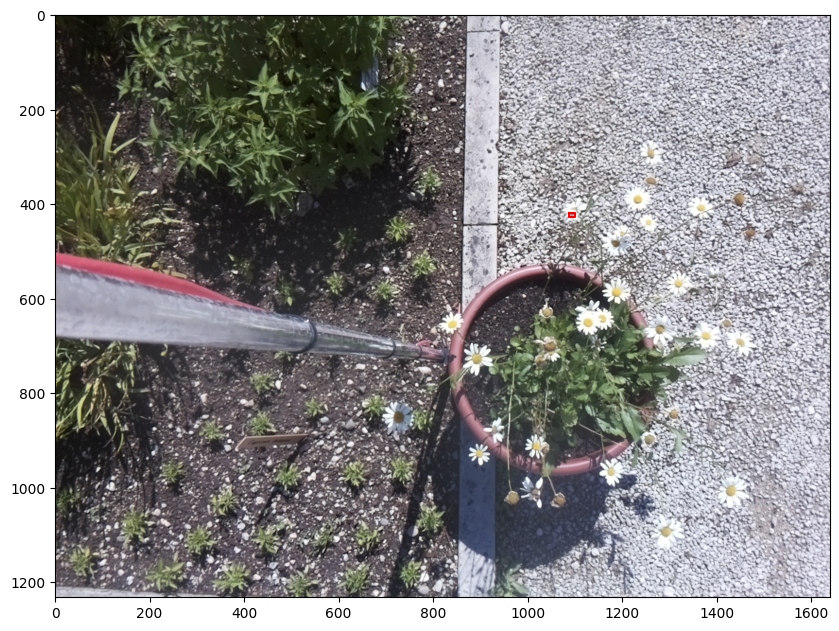

In [29]:
print('Pollinator')
sample = tmp_polli.sample(1)
draw_bbox(
    sample['object_name'].iloc[0], 
    sample['x0'].iloc[0],
    sample['x1'].iloc[0], 
    sample['y0'].iloc[0], 
    sample['y1'].iloc[0]
)

In [30]:
sample_flower = tmp[(tmp['object_name'] == sample['object_name'].iloc[0] )& (tmp['flower_box_id'] == sample['flower_box_id'].iloc[0])]

Flower


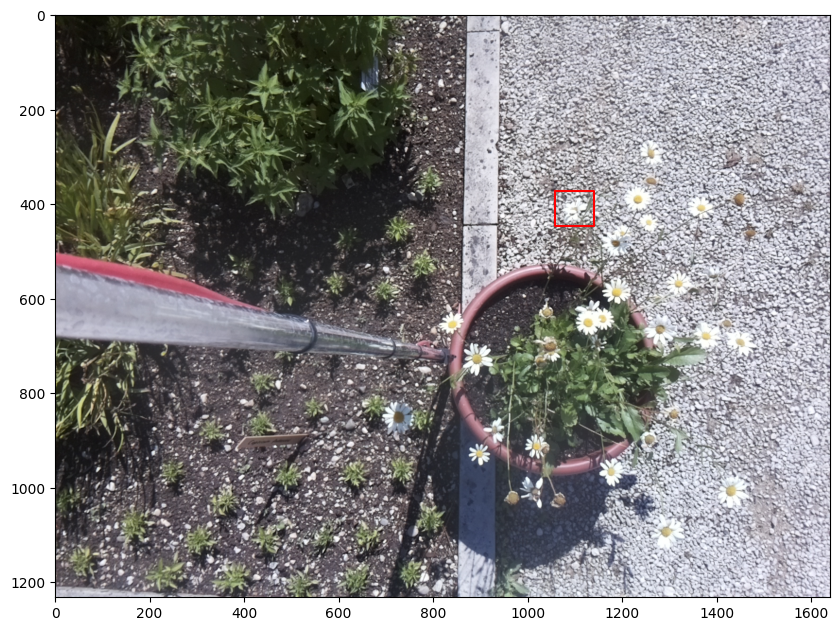

In [31]:
print('Flower')
draw_bbox(
    sample_flower['object_name'].iloc[0], 
    sample_flower['x0'].iloc[0],
    sample_flower['x1'].iloc[0], 
    sample_flower['y0'].iloc[0], 
    sample_flower['y1'].iloc[0]
)


## Check BBoxes in DB

In [9]:
with open('test_config.yaml', 'rb') as yaml_file:
    config = yaml.load(yaml_file, yaml.FullLoader)

In [13]:
conn = get_db_client('test_config.yaml')
minio_client = get_minio_client('test_config.yaml')

In [56]:
with conn.cursor() as cursor:
    cursor.execute(
        """
        SELECT files_image.object_name, image_results.result_id, 
        flowers.class AS flower_class, flowers.confidence AS flower_confidence, flowers.flower_id,
        flowers.x0 as flowers_x0, flowers.y0 as flowers_y0, flowers.x1 as flowers_x1, flowers.y1 as flowers_y1,
        pollinators.class AS polli_class, pollinators.confidence AS polli_conf, 
        pollinators.x0 AS polli_x0, pollinators.y0 as polli_y0, pollinators.x1 AS polli_x1, pollinators.y1 AS polli_y1
        FROM files_image
        JOIN image_results ON files_image.file_id = image_results.file_id
        JOIN flowers ON image_results.result_id = flowers.result_id
        JOIN pollinators ON flowers.flower_id = pollinators.flower_id
        LIMIT 20
        """)
    data = cursor.fetchall()
    columns = list(map(lambda x: x.name, list(cursor.description)))

In [58]:
df = pd.DataFrame.from_records(data, columns=columns)
df.head(3)

,object_name,result_id,flower_class,flower_confidence,flower_id,flowers_x0,flowers_y0,flowers_x1,flowers_y1,polli_class,polli_conf,polli_x0,polli_y0,polli_x1,polli_y1
0,0344-6782/2021-06-21/08/0344-6782_2021-06-21T0...,3023,daisy,0.902070,65891,1221,250,1301,333,wildbiene,0.702599,1256,298,1267,305
1,0344-6782/2021-06-21/08/0344-6782_2021-06-21T0...,3024,daisy,0.902518,65898,1229,619,1329,715,fliege,0.661216,1277,654,1290,665
2,0344-6782/2021-06-21/08/0344-6782_2021-06-21T0...,3179,daisy,0.928572,66993,1132,925,1213,1019,schwebfliege,0.676390,1170,974,1179,983


In [59]:
download_files.fn(client=minio_client, bucket_name='test', filenames=df['object_name'].to_list())

[WinError 183] Eine Datei kann nicht erstellt werden, wenn sie bereits vorhanden ist: '0344-6782/2021-06-21/08'
Loading 0344-6782/2021-06-21/08/0344-6782_2021-06-21T08-19-03Z.jpg
Loading 0344-6782/2021-06-21/08/0344-6782_2021-06-21T08-47-53Z.jpg
Loading 0344-6782/2021-06-21/08/0344-6782_2021-06-21T08-34-40Z.jpg
Loading 0344-6782/2021-06-21/08/0344-6782_2021-06-21T08-34-40Z.jpg
Loading 0344-6782/2021-06-21/08/0344-6782_2021-06-21T08-34-40Z.jpg
Loading 0344-6782/2021-06-21/08/0344-6782_2021-06-21T08-00-14Z.jpg
Loading 0344-6782/2021-06-21/08/0344-6782_2021-06-21T08-58-35Z.jpg
Loading 0344-6782/2021-06-21/08/0344-6782_2021-06-21T08-02-08Z.jpg
[WinError 32] Der Prozess kann nicht auf die Datei zugreifen, da sie von einem anderen Prozess verwendet wird: '0344-6782/2021-06-21/08/0344-6782_2021-06-21T08-34-40Z.jpg.eebff185bddff11557dc354614066fee.part.minio' -> '0344-6782/2021-06-21/08/0344-6782_2021-06-21T08-34-40Z.jpg' Not worked for 0344-6782/2021-06-21/08/0344-6782_2021-06-21T08-34-40Z.jp

In [66]:
sample['object_name']

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

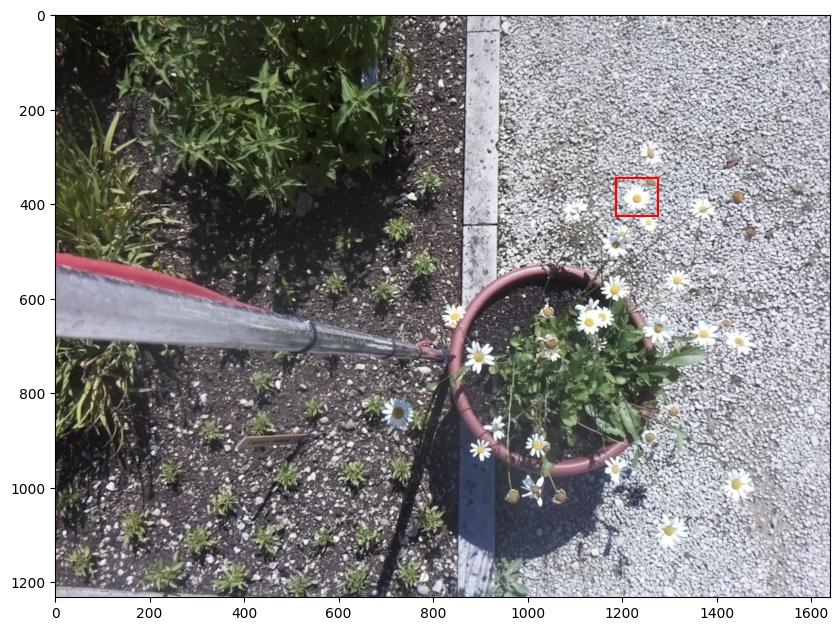

In [69]:
sample = df.sample(1)

draw_bbox(img_path=sample['object_name'].iloc[0],
          x0=sample['flowers_x0'].iloc[0],
          x1=sample['flowers_x1'].iloc[0],
          y0=sample['flowers_y0'].iloc[0],
          y1=sample['flowers_y1'].iloc[0])

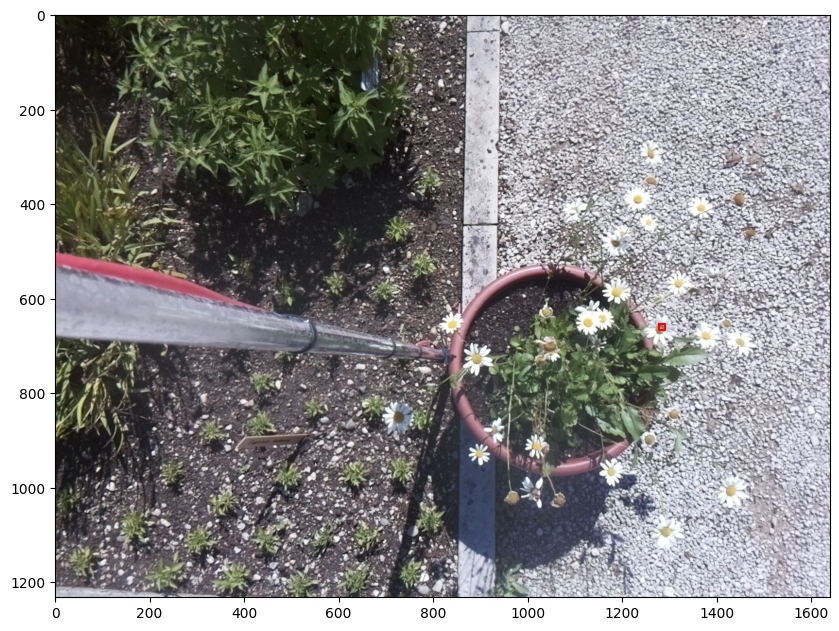

In [ ]:
sample = df.sample(1)

draw_bbox(img_path=sample['object_name'].iloc[0],
          x0=sample['polli_x0'].iloc[0],
          x1=sample['polli_x1'].iloc[0],
          y0=sample['polli_y0'].iloc[0],
          y1=sample['polli_y1'].iloc[0])

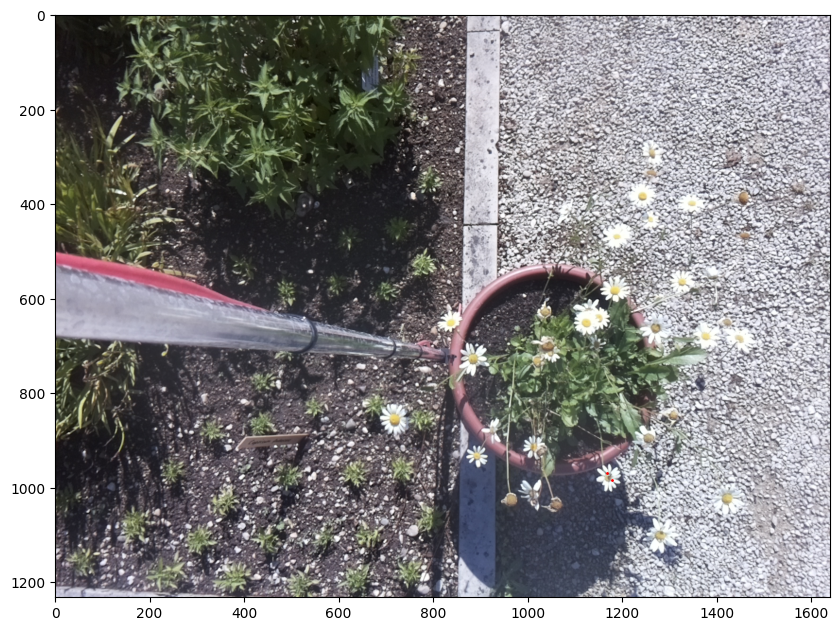

In [76]:
sample = df.sample(1)

draw_anchors(img_path=sample['object_name'].iloc[0],
          x0=sample['polli_x0'].iloc[0],
          x1=sample['polli_x1'].iloc[0],
          y0=sample['polli_y0'].iloc[0],
          y1=sample['polli_y1'].iloc[0])

In [61]:
def draw_zoomed_bbox(img_path, x0, x1, y0, y1, zoom=1, dpi=80):
    img = cv2.imread(img_path)[:,:,::-1]
    # Create figure and axes
    fig, ax = plt.subplots(figsize=(10, 10), dpi=dpi)
    
    # Display the image
    ax.imshow(img)

    # Coordinates of rectangle vertices
    # in clockwise order
    xs = [x0, x1, x1, x0, x0]
    ys = [y0, y0, y1, y1, y0]
    ax.plot(xs, ys, color="red")
    
    height = y1 - y0
    width = x1 - x0
    
    plt.xlim(x0-zoom*width, x1+zoom*width)
    plt.ylim(y0-zoom*height, y1+zoom*height)
    plt.show()

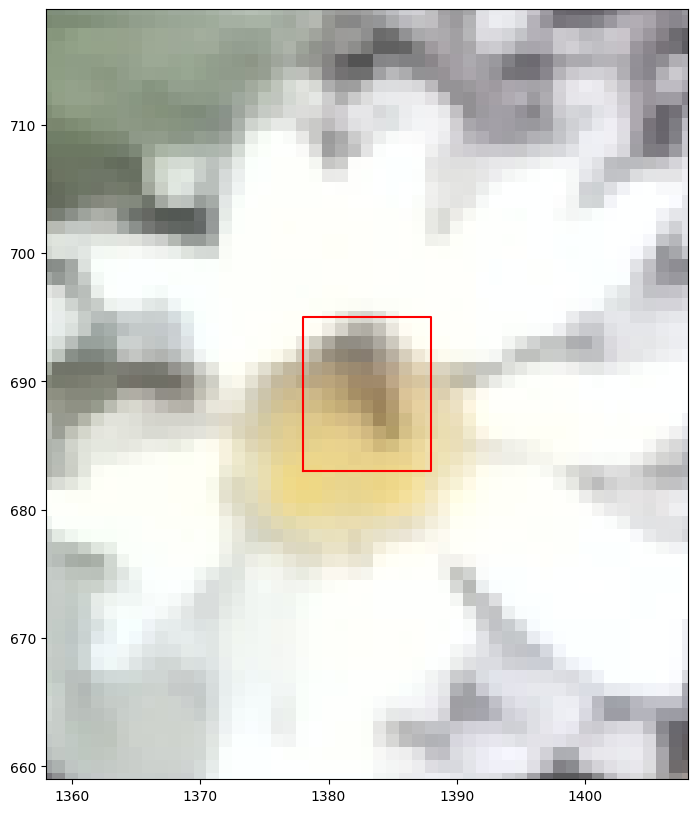

In [130]:
sample = df.sample(1)
draw_zoomed_bbox(
    img_path=sample['object_name'].iloc[0],
    x0=sample['polli_x0'].iloc[0],
    x1=sample['polli_x1'].iloc[0],
    y0=sample['polli_y0'].iloc[0],
    y1=sample['polli_y1'].iloc[0], 
    zoom=2
)

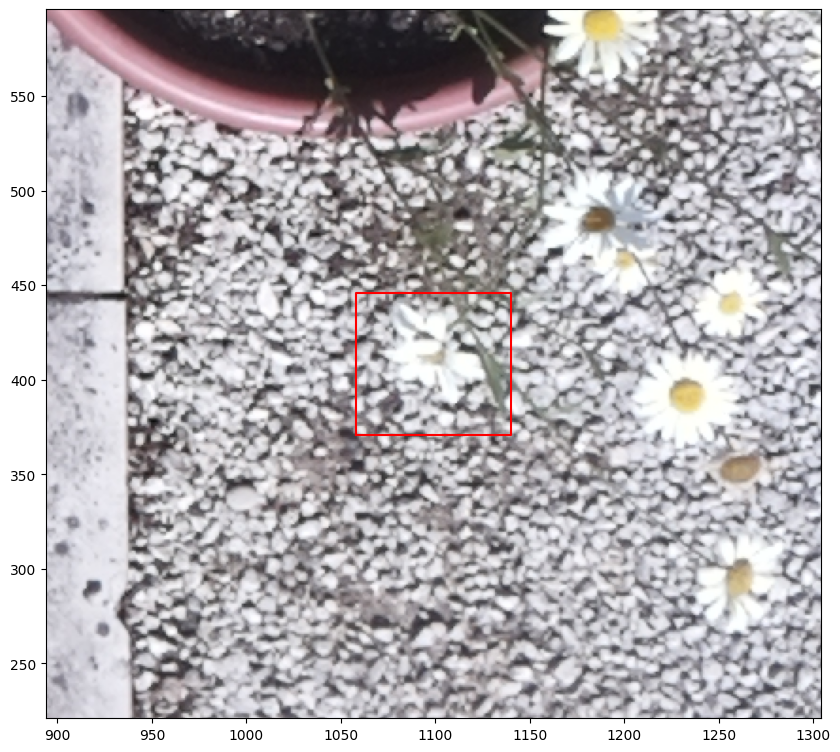

In [131]:
sample = df.sample(1)
draw_zoomed_bbox(
    img_path=sample['object_name'].iloc[0],
    x0=sample['flowers_x0'].iloc[0],
    x1=sample['flowers_x1'].iloc[0],
    y0=sample['flowers_y0'].iloc[0],
    y1=sample['flowers_y1'].iloc[0], 
    zoom=2
)

## Check local Bounding Boxes during Test run

In [42]:
flowers = pd.read_csv('flower_predictions.csv')
flowers.head(2)

,file_id,object_name,result_id,config_id,flower_box_id,flower_class,flower_score,flower_name,width,height,x0,y0,x1,y1
0,34,0344-6782/2021-06-21/08/0344-6782_2021-06-21T0...,5688,CONFIG017,0,0,0.917733,daisy,100,102,1269,1058,1339,1130
1,34,0344-6782/2021-06-21/08/0344-6782_2021-06-21T0...,5688,CONFIG017,1,0,0.908195,daisy,101,101,693,821,764,892


In [43]:
pollinators = pd.read_csv('pollinator_predictions.csv')
pollinators.head(2)

,object_name,flower_box_id,pollinator_scores,pollinator_names,result_id,flower_id,x0,y0,x1,y1
0,0344-6782/2021-06-21/08/0344-6782_2021-06-21T0...,16,0.783321,fliege,5698,103757,1273,657,1286,667
1,0344-6782/2021-06-21/08/0344-6782_2021-06-21T0...,11,0.738006,fliege,5699,103778,1006,1004,1026,1038


In [46]:
sample = flowers.sample(1)
sample['object_name']

140    0344-6782/2021-06-21/08/0344-6782_2021-06-21T0...
Name: object_name, dtype: object

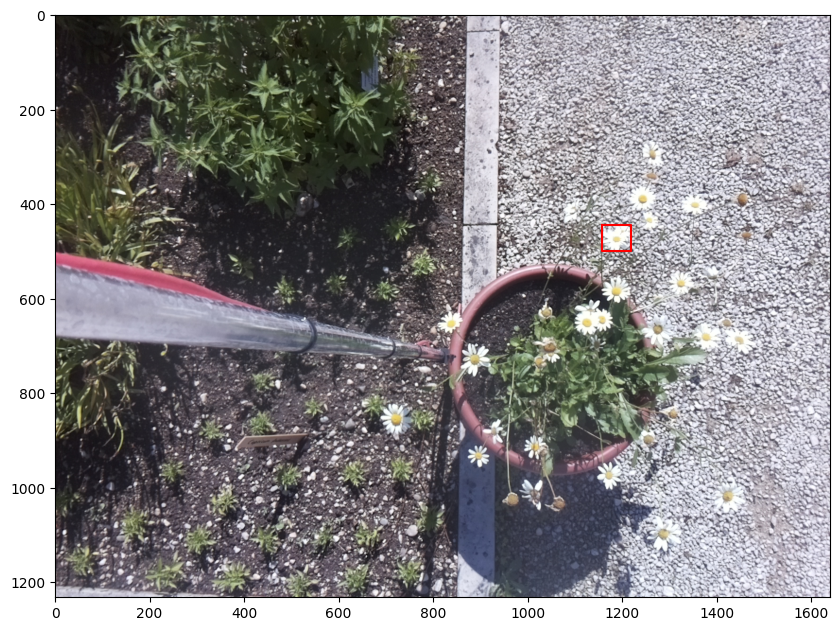

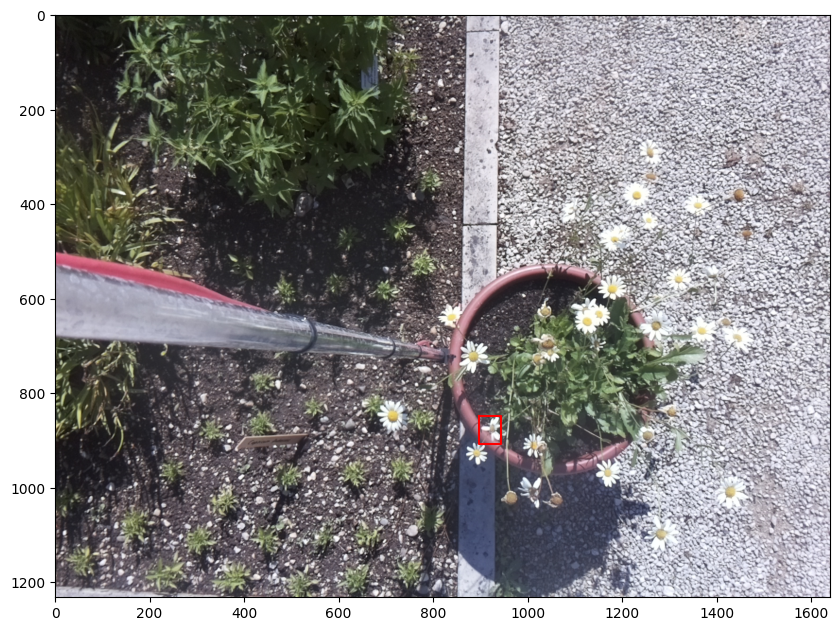

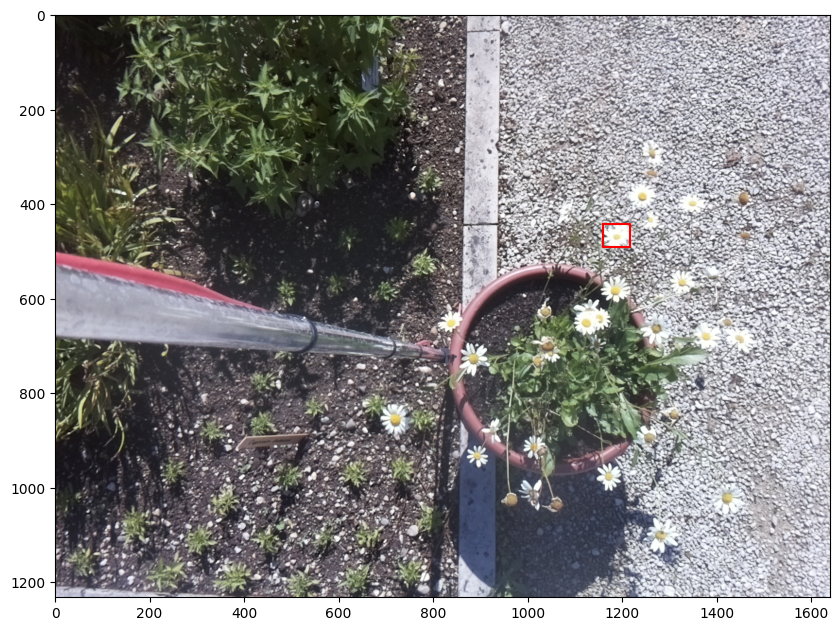

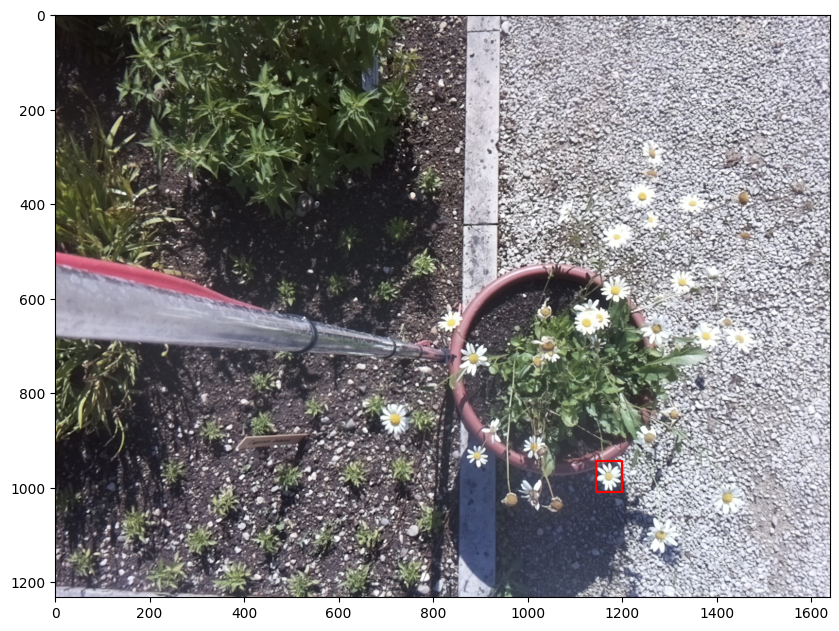

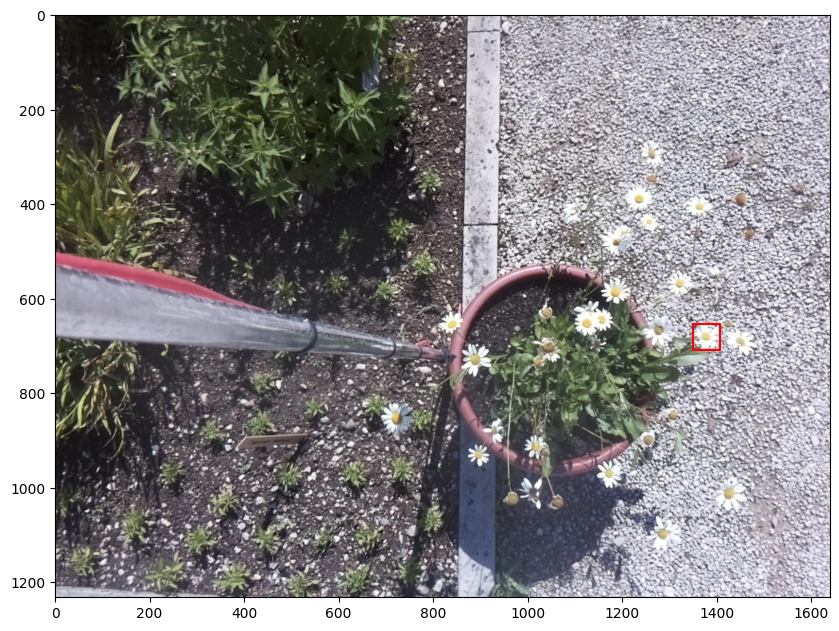

In [51]:
N = 5
samples = flowers.sample(N)

for idx, sample in samples.iterrows():
    draw_bbox(
        img_path=sample['object_name'],
        x0=sample['x0'],
        x1=sample['x1'],
        y0=sample['y0'],
        y1=sample['y1']
    )

In [53]:
pollinators

,object_name,flower_box_id,pollinator_scores,pollinator_names,result_id,flower_id,x0,y0,x1,y1
0,0344-6782/2021-06-21/08/0344-6782_2021-06-21T0...,16,0.783321,fliege,5698,103757,1273,657,1286,667
1,0344-6782/2021-06-21/08/0344-6782_2021-06-21T0...,11,0.738006,fliege,5699,103778,1006,1004,1026,1038
2,0344-6782/2021-06-21/08/0344-6782_2021-06-21T0...,24,0.761991,wildbiene,5700,103817,1088,419,1101,426


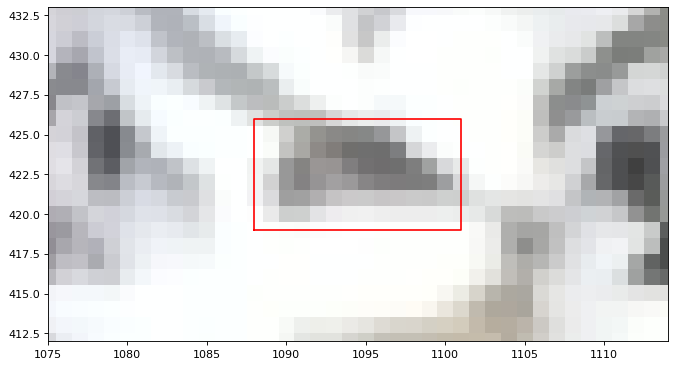

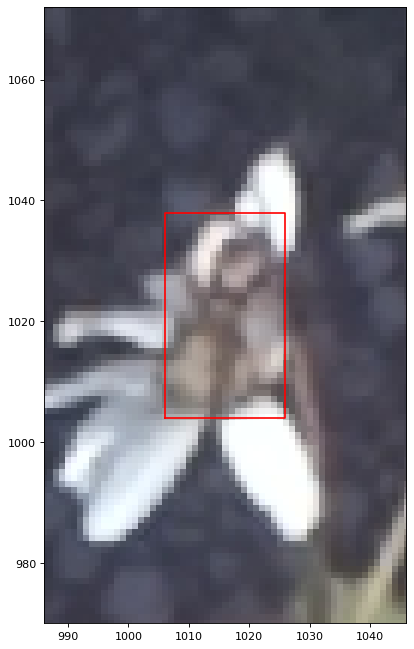

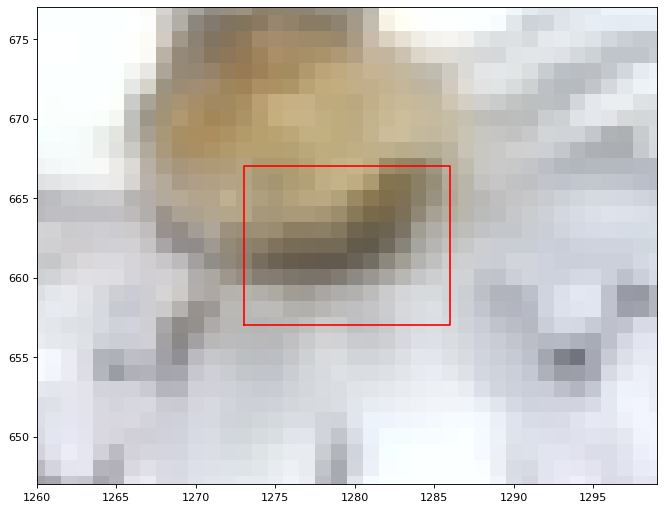

In [73]:
N = 3
samples = pollinators.sample(N)

for idx, sample in samples.iterrows():
    draw_zoomed_bbox(
        img_path=sample['object_name'],
        x0=sample['x0'],
        x1=sample['x1'],
        y0=sample['y0'],
        y1=sample['y1'],
        zoom=1, 
        dpi=80
    )